# Descripcion del negocio
BancAlpes es una entidad bancaria que está realizando una campaña de fidelización para aumentar la retención de clientes.
Esta campaña busca ofrecer los mejores productos, servicios y recomendaciones a sus clientes de acuerdo con sus características.
Por esta razón, ha recurrido a ustedes como consultores para que le entreguen al equipo de marketing información que pueda ayudarlos a orientar mejor sus campañas.
En particular, el grupo de marketing espera que le provean grupos a los cuales pueden dirigir sus campañas y las caracteristicas de los clientes en dichos grupos.
BancAlpes considera que esta nueva estrategia de marketing le permitirá aumentar el consumo de productos y servicios y por supuesto, aumentar la retención de clientes.
Los datos proporcionados al equipo contienen el resumen de los clientes del último año, en particular, sus interacciones con la entidad bancaria y el número de tarjetas de crédito.


### Librerias

In [280]:
# Manejo de Datos

import pandas as pd
import numpy as np
import sys
from pandas_profiling import ProfileReport

# Modelado de datos
from sklearn.cluster import KMeans, AffinityPropagation, AgglomerativeClustering, SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, MinMaxScaler, MaxAbsScaler, LabelEncoder, StandardScaler, Normalizer, RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import silhouette_score
from sklearn import mixture
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, plot_confusion_matrix
from sklearn.compose import make_column_selector, ColumnTransformer
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import KFold
from sklearn.neighbors import  KNeighborsClassifier
from imblearn.over_sampling import SMOTE

# Visualizacion de datos
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_palette("Paired")


## Perfilamiento y preparacion de los datos

### Carga de datos

In [26]:
# Se cargan los datos.
data=pd.read_csv('datos/bancalpes2_data.csv', sep=',', encoding = 'utf-8', index_col=0)
data.head()

,GENDER,BALANCE,PURCHASES,BALANCE_FREQUENCY,CASH_ADVANCE,CASH_ADVANCE_TRX,PURCHASES_FREQUENCY,PURCHASES_TRX,ONEOFF_PURCHASES_FREQUENCY,CASH_ADVANCE_FREQUENCY,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,TENURE
CUST_ID,,,,,,,,,,,,,,
C12529,F,107.944741,118.16,0.875,472.818286,1.0,0.125000,2,0.125,0.125000,2500.0,192.781455,56.999671,8
C14138,NaN,241.032979,0.00,1.000,642.862505,1.0,0.000000,0,NaN,0.083333,1500.0,915.454305,195.162256,12
C15409,NaN,894.357857,1164.00,1.000,0.0,0.0,1.000000,12,NaN,0.000000,2000.0,907.603723,270.413449,-12
C18141,F,-188.132508,515.88,1.000,0.0,NaN,0.833333,14,NaN,0.000000,2700.0,601.729266,194.534934,12
C15879,NaN,3881.679582,15.92,1.000,2183.782456,9.0,0.083333,1,NaN,0.333333,5500.0,1032.183632,1129.747227,12


### Perfilamiento y entendimiento de los datos

In [27]:
data.shape

(5530, 14)

In [28]:
data.isnull().sum(axis=0)

GENDER                        2714
BALANCE                          0
PURCHASES                        0
BALANCE_FREQUENCY                0
CASH_ADVANCE                     0
CASH_ADVANCE_TRX               150
PURCHASES_FREQUENCY              0
PURCHASES_TRX                    0
ONEOFF_PURCHASES_FREQUENCY    2740
CASH_ADVANCE_FREQUENCY         166
CREDIT_LIMIT                     0
PAYMENTS                         0
MINIMUM_PAYMENTS                 0
TENURE                         163
dtype: int64

In [29]:
data.isin(['??']).sum(axis=0)

GENDER                         0
BALANCE                        0
PURCHASES                      0
BALANCE_FREQUENCY              0
CASH_ADVANCE                  75
CASH_ADVANCE_TRX               0
PURCHASES_FREQUENCY            0
PURCHASES_TRX                 65
ONEOFF_PURCHASES_FREQUENCY     0
CASH_ADVANCE_FREQUENCY         0
CREDIT_LIMIT                   0
PAYMENTS                       0
MINIMUM_PAYMENTS              89
TENURE                        69
dtype: int64

In [30]:
data_f=data[~data.isin(['??'])]
data_f=data_f.dropna(axis=0)
data_f.describe()

,BALANCE,PURCHASES,BALANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,CASH_ADVANCE_FREQUENCY,CREDIT_LIMIT,PAYMENTS
count,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000
mean,1043.099209,551.669668,30.843854,42.931120,12.691163,0.145292,0.116899,3699.675007,1151.188161
std,1387.520477,811.837215,163.160434,592.591521,94.547850,0.237030,0.172440,2756.166244,1298.232853
min,-4530.639094,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,300.000000,12.773144
25%,66.739040,11.410000,0.818182,0.000000,0.083333,0.000000,0.000000,1500.000000,350.164857
50%,616.570241,270.000000,1.000000,0.000000,0.400000,0.000000,0.000000,3000.000000,685.660178
75%,1574.330411,740.700000,1.000000,4.000000,0.833333,0.166667,0.166667,5500.000000,1417.666972
max,7005.310696,8945.670000,1000.000000,17000.000000,1000.000000,1.000000,1.166667,12500.000000,9724.871142


In [31]:
#data_f.drop_duplicates()

In [32]:
data_f.shape

(1205, 14)

In [33]:
profile = ProfileReport(data_f)

In [34]:
#profile.to_notebook_iframe()

In [35]:
data_f["GENDER"]=data_f["GENDER"][~data_f["GENDER"].str.isnumeric()]
data_f=data_f.dropna(axis=0)
data_f["GENDER"] = data_f["GENDER"].astype(str).str[0].str.upper()
data_f.shape

(1205, 14)

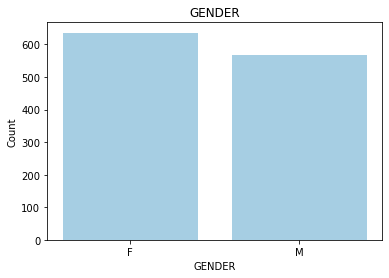

In [36]:
plt.bar(data_f['GENDER'].unique(),data_f['GENDER'].value_counts())
plt.title('GENDER')
plt.xlabel('GENDER')
plt.ylabel('Count')
plt.show()

In [37]:
data_f['TENURE'] = np.where(data_f['TENURE'].str.isnumeric(),data_f['TENURE'],'12')
data_f['TENURE'] = np.where(data_f['TENURE'].astype(int)>12,'12',data_f['TENURE'])
data_f['TENURE'] = np.where(data_f['TENURE'].astype(int)<1,'1',data_f['TENURE'])
data_f.shape

(1205, 14)

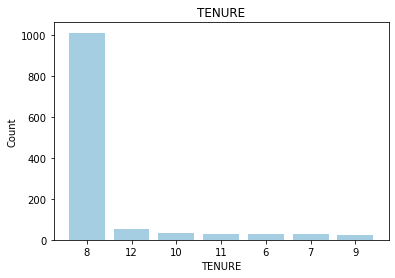

In [38]:
plt.bar(data_f['TENURE'].unique(),data_f['TENURE'].value_counts())
plt.title('TENURE')
plt.xlabel('TENURE')
plt.ylabel('Count')
plt.show()

In [83]:
data_f['CASH_ADVANCE'] = pd.to_numeric(data_f['CASH_ADVANCE'],errors='coerce')
data_f['CASH_ADVANCE_FREQUENCY'] = pd.to_numeric(data_f['CASH_ADVANCE_FREQUENCY'],errors='coerce')
data_f['PURCHASES_TRX'] = pd.to_numeric(data_f['PURCHASES_TRX'],errors='coerce')
data_f['PURCHASES_FREQUENCY'] = pd.to_numeric(data_f['PURCHASES_FREQUENCY'],errors='coerce')
data_f['CASH_ADVANCE_TRX'] = pd.to_numeric(data_f['CASH_ADVANCE_TRX'],errors='coerce')
data_f['CASH_ADVANCE_FREQUENCY'] = np.where(data_f['CASH_ADVANCE_FREQUENCY']==("nan"),'0',data_f['CASH_ADVANCE_FREQUENCY'])
data_f['CASH_ADVANCE'] = np.where(data_f['CASH_ADVANCE']==("nan"),'0',data_f['CASH_ADVANCE'])
data_f['CASH_ADVANCE_TRX'] = np.where(data_f['CASH_ADVANCE_TRX']==("nan"),'0',data_f['CASH_ADVANCE_TRX'])
data_f['PURCHASES_TRX'] = np.where(data_f['PURCHASES_TRX']==("nan"),'0',data_f['PURCHASES_TRX'])
data_f['PURCHASES_FREQUENCY'] = np.where(data_f['PURCHASES_TRX']==("nan"),'0',data_f['PURCHASES_TRX'])
data_f['CASH_ADVANCE_FREQUENCY'] = np.where(data_f['CASH_ADVANCE_FREQUENCY'].astype(float)>1,'1',data_f['CASH_ADVANCE_FREQUENCY'])
data_f['CASH_ADVANCE'] = np.where(data_f['CASH_ADVANCE'].astype(float)>5000,'5000',data_f['CASH_ADVANCE'])
data_f['CASH_ADVANCE'] = np.where(data_f['CASH_ADVANCE'].astype(float)<0,'0',data_f['CASH_ADVANCE'])
data_f['CASH_ADVANCE_FREQUENCY'] = np.where(data_f['CASH_ADVANCE_FREQUENCY'].astype(float)<0,'0',data_f['CASH_ADVANCE_FREQUENCY'])
data_f['CASH_ADVANCE_TRX'] = np.where(data_f['CASH_ADVANCE_TRX'].astype(float)<0,'0',data_f['CASH_ADVANCE_TRX'])
data_f['CASH_ADVANCE_TRX'] = np.where(data_f['CASH_ADVANCE_TRX'].astype(float)>15,'15',data_f['CASH_ADVANCE_TRX'])
data_f['PURCHASES_FREQUENCY'] = np.where(data_f['PURCHASES_FREQUENCY'].astype(float)<0,'0',data_f['PURCHASES_FREQUENCY'])
data_f['PURCHASES_FREQUENCY'] = np.where(data_f['PURCHASES_FREQUENCY'].astype(float)>1,'1',data_f['PURCHASES_FREQUENCY'])
data_f['PURCHASES_TRX'] = np.where(data_f['PURCHASES_TRX'].astype(float)<0,'0',data_f['PURCHASES_TRX'])
data_f['PURCHASES_TRX'] = np.where(data_f['PURCHASES_TRX'].astype(float)>30,'30',data_f['PURCHASES_TRX'])
data_f['BALANCE'] = np.where(data_f['BALANCE'].astype(float)<0,'0',data_f['BALANCE'])
data_f['BALANCE'] = np.where(data_f['BALANCE'].astype(float)>5000,'5000',data_f['BALANCE'])
data_f['BALANCE_FREQUENCY'] = np.where(data_f['BALANCE_FREQUENCY'].astype(float)<0,'0',data_f['BALANCE_FREQUENCY'])
data_f['BALANCE_FREQUENCY'] = np.where(data_f['BALANCE_FREQUENCY'].astype(float)>1,'1',data_f['BALANCE_FREQUENCY'])

data_f.shape

(1205, 14)

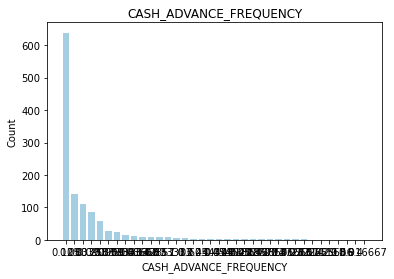

In [84]:
plt.bar(data_f['CASH_ADVANCE_FREQUENCY'].unique(),data_f['CASH_ADVANCE_FREQUENCY'].value_counts())
plt.title('CASH_ADVANCE_FREQUENCY')
plt.xlabel('CASH_ADVANCE_FREQUENCY')
plt.ylabel('Count')
plt.show()

In [85]:
data_f.dtypes

GENDER                         object
BALANCE                        object
PURCHASES                     float64
BALANCE_FREQUENCY              object
CASH_ADVANCE                   object
CASH_ADVANCE_TRX               object
PURCHASES_FREQUENCY            object
PURCHASES_TRX                  object
ONEOFF_PURCHASES_FREQUENCY    float64
CASH_ADVANCE_FREQUENCY         object
CREDIT_LIMIT                  float64
PAYMENTS                      float64
MINIMUM_PAYMENTS               object
TENURE                         object
dtype: object

In [86]:
data_f

,GENDER,BALANCE,PURCHASES,BALANCE_FREQUENCY,CASH_ADVANCE,CASH_ADVANCE_TRX,PURCHASES_FREQUENCY,PURCHASES_TRX,ONEOFF_PURCHASES_FREQUENCY,CASH_ADVANCE_FREQUENCY,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,TENURE
CUST_ID,,,,,,,,,,,,,,
C12529,F,107.944741,118.16,0.875,472.818286,1.0,1,2.0,0.125000,0.125,2500.0,192.781455,56.999671,8
C12780,F,28.445432,166.20,0.545455,0.0,0.0,1,3.0,0.250000,0.0,5500.0,236.022703,97.531842,12
C18938,F,10.318754,102.66,0.625,0.0,0.0,1,3.0,0.000000,0.0,1500.0,190.431856,55.178854,8
C11282,M,1548.224072,696.63,1.0,0.0,0.0,1,2.0,0.083333,0.0,1800.0,588.329981,918.350562,12
C14673,M,2439.976275,499.59,1.0,0.0,0.0,1,11.0,0.000000,0.0,2700.0,555.286351,617.276328,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C12628,M,153.949311,0.00,0.363636,3988.242395,7.0,0.0,0.0,0.000000,0.25,11500.0,2699.969008,17.401529,12
C16962,F,1425.606151,103.00,1.0,0.0,0.0,1,2.0,0.166667,0.0,1500.0,590.371530,516.506067,12
C16448,M,965.514081,8945.67,1.0,0.0,0.0,1,23.0,0.916667,0.0,5500.0,7917.840874,261.663214,12


In [87]:
data_f[['BALANCE','PURCHASES','BALANCE_FREQUENCY','PURCHASES_FREQUENCY','PAYMENTS','CREDIT_LIMIT']] =data_f[['BALANCE','PURCHASES','BALANCE_FREQUENCY','PURCHASES_FREQUENCY','PAYMENTS','CREDIT_LIMIT']].apply(pd.to_numeric)
data_f.dtypes

GENDER                         object
BALANCE                       float64
PURCHASES                     float64
BALANCE_FREQUENCY             float64
CASH_ADVANCE                   object
CASH_ADVANCE_TRX               object
PURCHASES_FREQUENCY           float64
PURCHASES_TRX                  object
ONEOFF_PURCHASES_FREQUENCY    float64
CASH_ADVANCE_FREQUENCY         object
CREDIT_LIMIT                  float64
PAYMENTS                      float64
MINIMUM_PAYMENTS               object
TENURE                         object
dtype: object

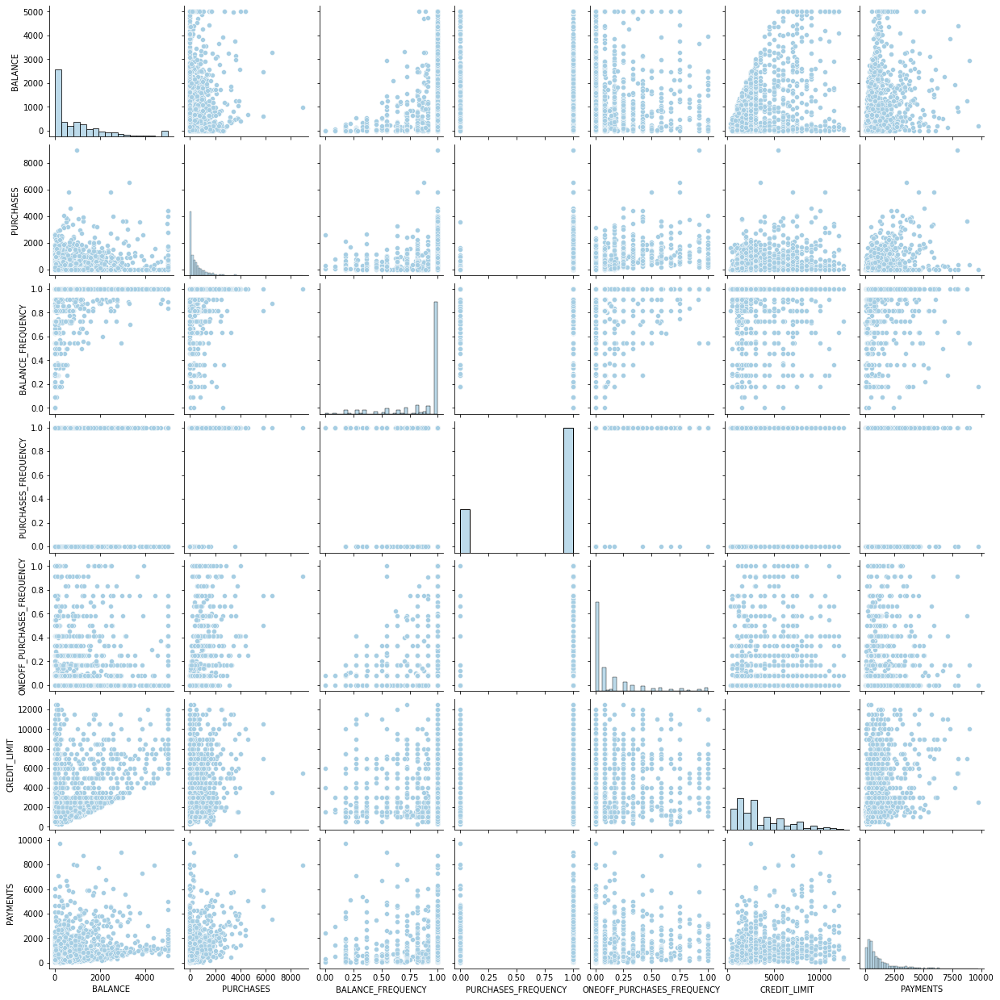

In [88]:
sns.pairplot(data_f)

In [89]:
ProfileReport(data_f)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Modelamiento

In [251]:
cont_vars = ['CREDIT_LIMIT','PURCHASES','BALANCE','PAYMENTS','CASH_ADVANCE']
cate_vars = []
cols = cont_vars+cate_vars
ct = ColumnTransformer([
    ('num', SimpleImputer(strategy='mean'),
     cont_vars),
    ('cat',
     SimpleImputer(strategy='most_frequent'),
     cate_vars)
])

pre_pro = [   ('imputer', ct),
              ('encoder', OrdinalEncoder()),
              ('normalizer', StandardScaler())
]
pipe = Pipeline(pre_pro)
pipe.fit(data_f)
data_pre = pd.DataFrame(pipe.transform(data_f),columns=cols)
data_pre

,CREDIT_LIMIT,PURCHASES,BALANCE,PAYMENTS,CASH_ADVANCE
0,-0.227788,-0.680853,-0.675263,-1.351144,0.283949
1,0.800059,-0.507560,-1.181904,-1.239028,-0.739594
2,-0.913019,-0.746704,-1.439567,-1.356893,-0.739594
3,-0.766184,0.826795,0.853346,-0.201234,-0.739594
4,-0.129897,0.449017,1.278924,-0.293227,-0.739594
...,...,...,...,...,...
1200,2.023687,-1.124482,-0.547879,1.377017,2.158589
1201,-0.913019,-0.739772,0.795444,-0.186860,-0.739594
1202,0.800059,1.911609,0.323544,1.716240,-0.739594
1203,0.800059,1.818031,1.490266,1.486258,2.191965


## Seleccion K clusters

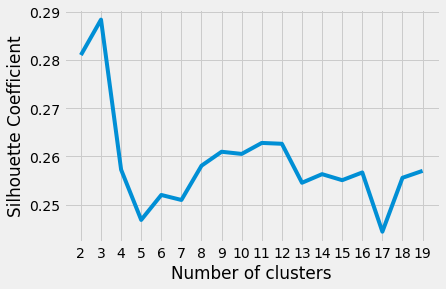

In [252]:
def plot_selectK_silhoute(data,
                          k_min=1,
                          k_max=11,
                          ylabel = 'Silhouette Coefficient',
                          xlabel = 'Number of clusters',
                          style = 'fivethirtyeight'):
    silhouette_coefficients = []

    # Notice you start at 2 clusters for silhouette coefficient
    for k in range(k_min, k_max):
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(data)
        score = silhouette_score(data, kmeans.labels_)
        silhouette_coefficients.append(score)
    plt.style.use(style)
    plt.plot(range(k_min, k_max), silhouette_coefficients)
    plt.xticks(range(k_min, k_max))
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()
    return silhouette_coefficients.index(max(silhouette_coefficients))+2

K_parts = plot_selectK_silhoute(data_pre,
                      k_min=2,
                      k_max=20)

### K-means

In [253]:
kmeans = KMeans(n_clusters=K_parts, random_state=0)
kmeans = kmeans.fit(data_pre)
cols_number= data_pre.to_numpy()
cols_number

array([[-0.22778766, -0.68085256, -0.67526265, -1.35114383,  0.28394858],
       [ 0.80005947, -0.5075597 , -1.18190364, -1.23902764, -0.73959397],
       [-0.91301908, -0.74670385, -1.43956677, -1.35689338, -0.73959397],
       ...,
       [ 0.80005947,  1.91160869,  0.32354388,  1.71624015, -0.73959397],
       [ 0.80005947,  1.81803054,  1.49026571,  1.48625822,  2.1919654 ],
       [-0.91301908,  0.50447063,  0.80991923,  0.28460264, -0.73959397]])

<AxesSubplot:>

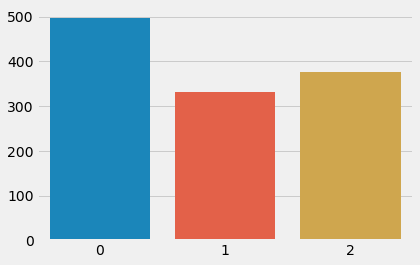

In [254]:
labels = kmeans.labels_
data_clust_kmeans=data_pre.copy()
data_clust_kmeans['Cluster'] = labels
cluster_distrib = data_clust_kmeans['Cluster'].value_counts()
fig= plt.figure()
sns.barplot(x=cluster_distrib.index,y=cluster_distrib.values)

In [255]:
data_clust_kmeans.groupby('Cluster').count()

,CREDIT_LIMIT,PURCHASES,BALANCE,PAYMENTS,CASH_ADVANCE
Cluster,,,,,
0,497,497,497,497,497
1,331,331,331,331,331
2,377,377,377,377,377


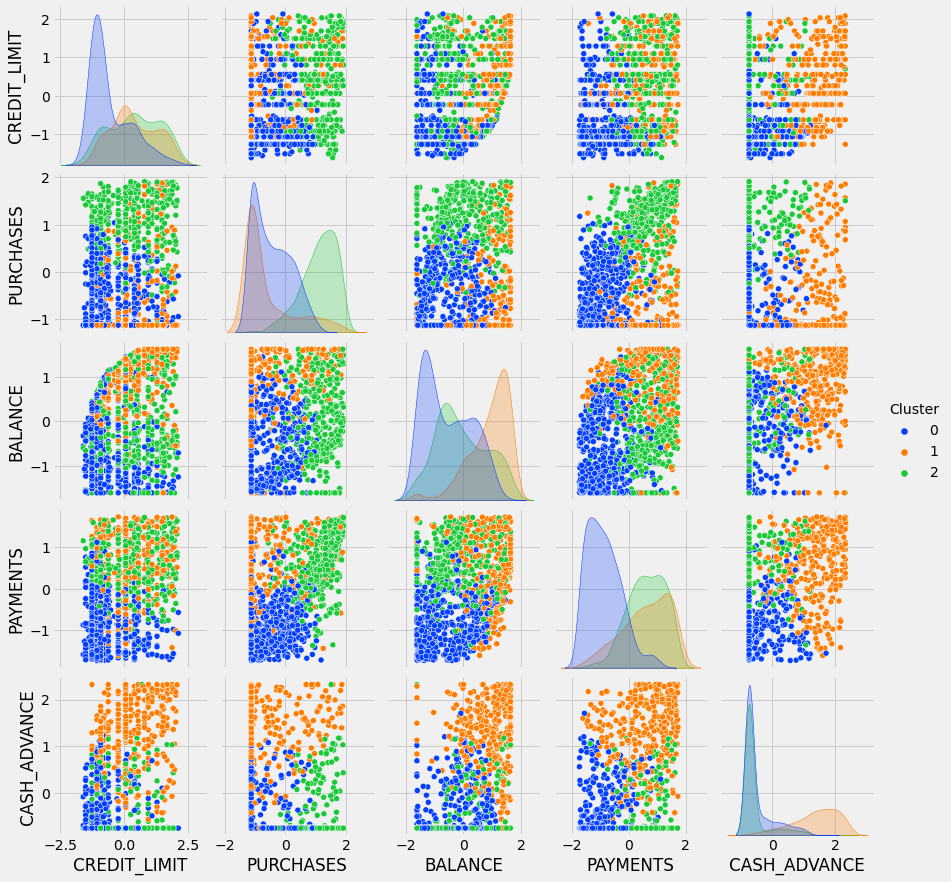

In [256]:
sns.pairplot(data_clust_kmeans, hue='Cluster', palette='bright')

array([[<AxesSubplot:title={'center':'BALANCE'}, xlabel='[Cluster]'>,
        <AxesSubplot:title={'center':'CASH_ADVANCE'}, xlabel='[Cluster]'>,
        <AxesSubplot:title={'center':'CREDIT_LIMIT'}, xlabel='[Cluster]'>,
        <AxesSubplot:title={'center':'PAYMENTS'}, xlabel='[Cluster]'>,
        <AxesSubplot:title={'center':'PURCHASES'}, xlabel='[Cluster]'>,
        <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

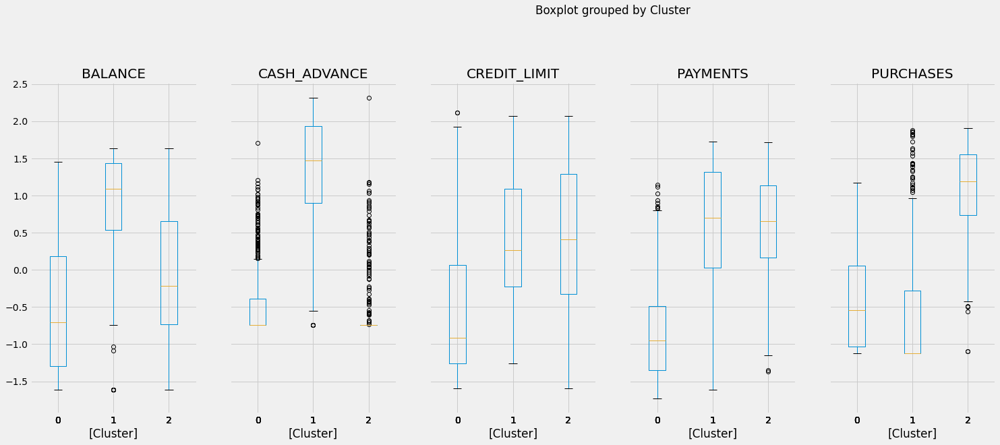

In [257]:
data_clust_kmeans.boxplot(by="Cluster", layout=(2,6), figsize=(30,20))

### Spectral Clustering

In [258]:
spectral = SpectralClustering(n_clusters=K_parts)
spectral = spectral.fit(data_pre)
cols_number_spe= data_pre.to_numpy()
cols_number_spe


array([[-0.22778766, -0.68085256, -0.67526265, -1.35114383,  0.28394858],
       [ 0.80005947, -0.5075597 , -1.18190364, -1.23902764, -0.73959397],
       [-0.91301908, -0.74670385, -1.43956677, -1.35689338, -0.73959397],
       ...,
       [ 0.80005947,  1.91160869,  0.32354388,  1.71624015, -0.73959397],
       [ 0.80005947,  1.81803054,  1.49026571,  1.48625822,  2.1919654 ],
       [-0.91301908,  0.50447063,  0.80991923,  0.28460264, -0.73959397]])

<AxesSubplot:>

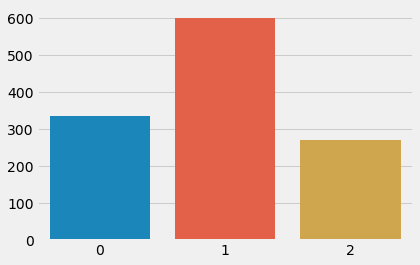

In [259]:
labels = spectral.labels_
data_clust_spectral=data_pre.copy()
data_clust_spectral['Cluster'] = labels
spectral_cluster_distrib = data_clust_spectral['Cluster'].value_counts()
fig= plt.figure()
sns.barplot(x=spectral_cluster_distrib.index,y=spectral_cluster_distrib.values)

In [260]:
data_clust_spectral.groupby('Cluster').count()

,CREDIT_LIMIT,PURCHASES,BALANCE,PAYMENTS,CASH_ADVANCE
Cluster,,,,,
0,335,335,335,335,335
1,600,600,600,600,600
2,270,270,270,270,270


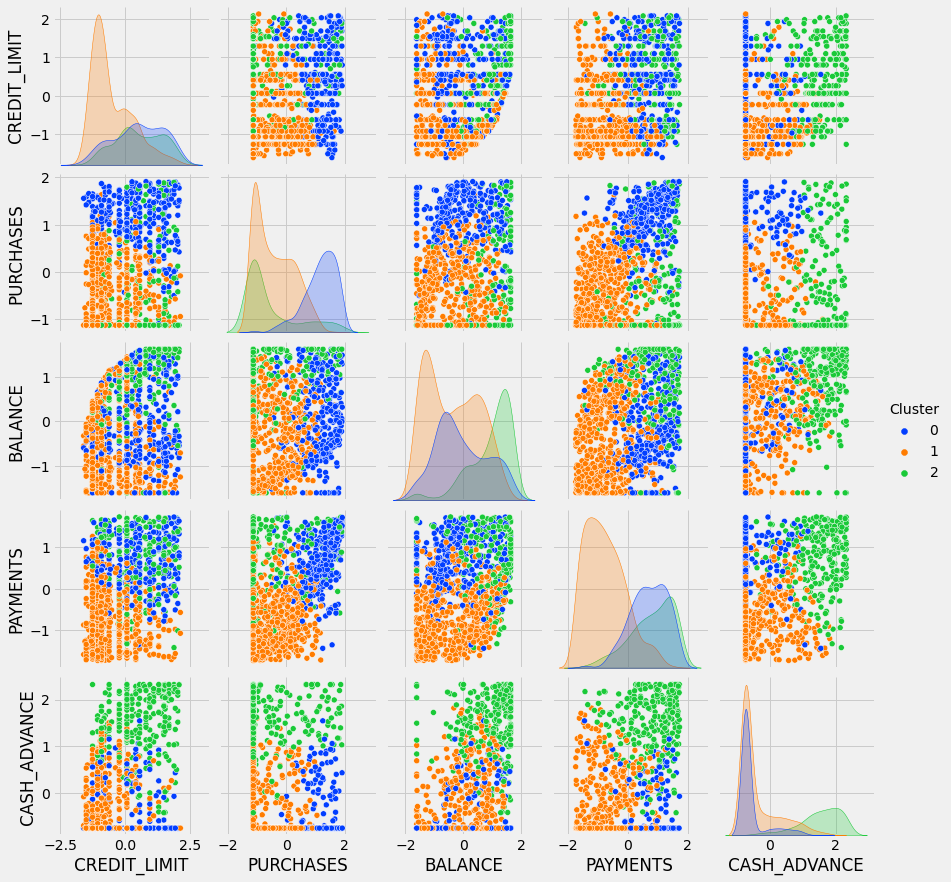

In [261]:
sns.pairplot(data_clust_spectral, hue='Cluster', palette='bright')

array([[<AxesSubplot:title={'center':'BALANCE'}, xlabel='[Cluster]'>,
        <AxesSubplot:title={'center':'CASH_ADVANCE'}, xlabel='[Cluster]'>,
        <AxesSubplot:title={'center':'CREDIT_LIMIT'}, xlabel='[Cluster]'>,
        <AxesSubplot:title={'center':'PAYMENTS'}, xlabel='[Cluster]'>,
        <AxesSubplot:title={'center':'PURCHASES'}, xlabel='[Cluster]'>,
        <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

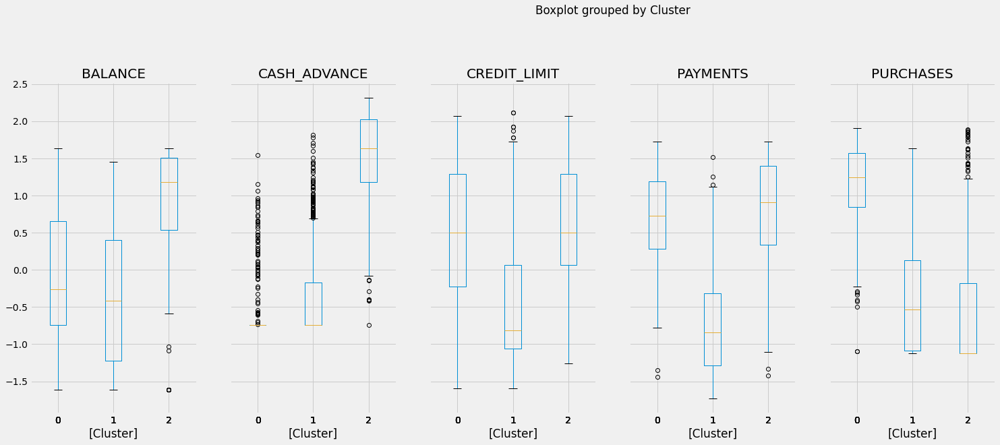

In [262]:
data_clust_spectral.boxplot(by="Cluster", layout=(2,6), figsize=(30,20))

### AgglomerativeClustering

In [281]:
agglomerative = AgglomerativeClustering(n_clusters=K_parts)
agglomerative = agglomerative.fit(data_pre)
cols_number_ag= data_pre.to_numpy()
cols_number_ag


array([[-0.22778766, -0.68085256, -0.67526265, -1.35114383,  0.28394858],
       [ 0.80005947, -0.5075597 , -1.18190364, -1.23902764, -0.73959397],
       [-0.91301908, -0.74670385, -1.43956677, -1.35689338, -0.73959397],
       ...,
       [ 0.80005947,  1.91160869,  0.32354388,  1.71624015, -0.73959397],
       [ 0.80005947,  1.81803054,  1.49026571,  1.48625822,  2.1919654 ],
       [-0.91301908,  0.50447063,  0.80991923,  0.28460264, -0.73959397]])

<AxesSubplot:>

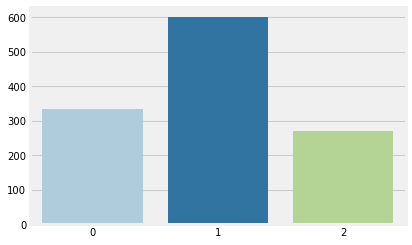

In [285]:
labels = spectral.labels_
data_clust_ag=data_pre.copy()
data_clust_ag['Cluster'] = labels
agglomerative_cluster_distrib = data_clust_ag['Cluster'].value_counts()
fig= plt.figure()
sns.barplot(x=agglomerative_cluster_distrib.index,y=agglomerative_cluster_distrib.values)

In [286]:
data_clust_ag.groupby('Cluster').count()

,CREDIT_LIMIT,PURCHASES,BALANCE,PAYMENTS,CASH_ADVANCE
Cluster,,,,,
0,335,335,335,335,335
1,600,600,600,600,600
2,270,270,270,270,270


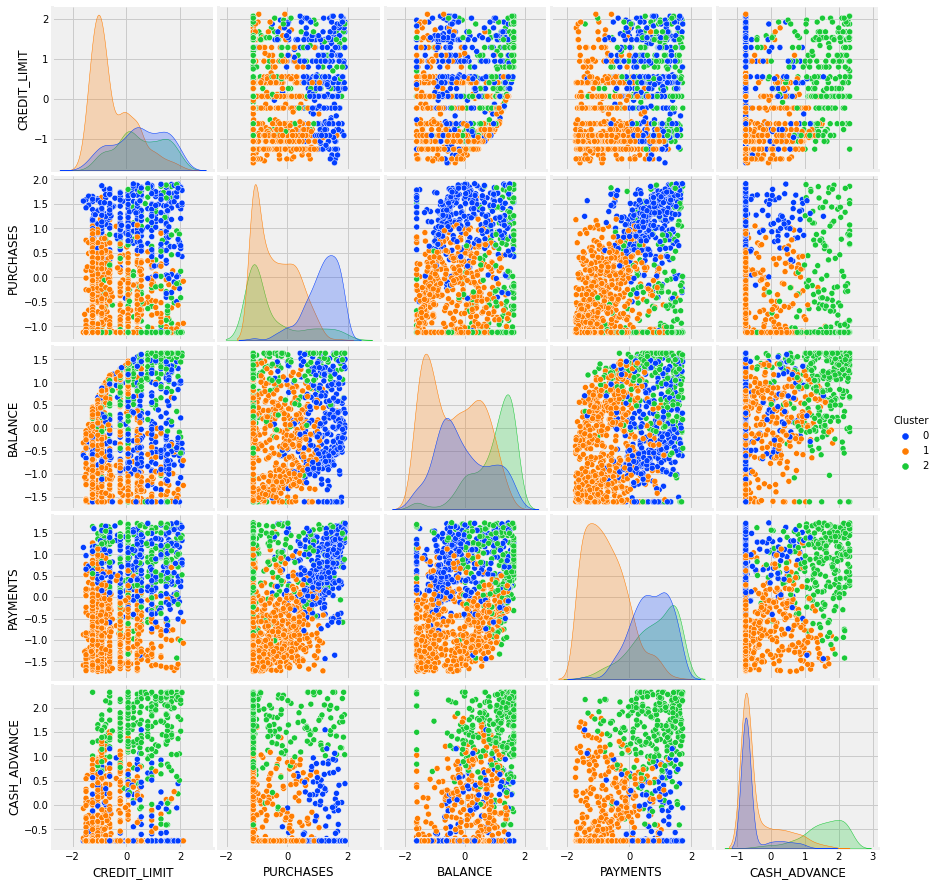

In [287]:
sns.pairplot(data_clust_ag, hue='Cluster', palette='bright')